# <center>Analysis of Covid-19 chest X-rays</center>
In order to diagnose patients with Covid-19, the analysis of chest X-rays is a possibility to be explored to more easily detect positive cases. If the classification through deep learning of such data proves effective in detecting positive cases, then this method can be used in hospitals and clinics when traditional testing cannot be done.


## <center>Data Exploration</center>

Upgrade matplotlib to use subfigures

Necesary with default 3.2.2 google colab available version

In [ ]:
import matplotlib
matplotlib.__version__

In [ ]:
!pip install matplotlib --upgrade

Initialise code for google colab

Mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Create data base files under google colab environment

In [ ]:
!unzip '/content/drive/MyDrive/data.zip' -d '/content/'

For Luc because my archive made on mac create a __MACOSX folder

In [ ]:
%rm -rf /content/__MACOSX

Define working directory to our jupyter repertory:
* because path to the different repertories (./data, ./output...) are define relatevly to jupyter one
* let import _mypath which add ./lib to python path in order to import our own define libraries


In [ ]:
%cd /content/gdrive/MyDrive/covid-19-xRay/jupyter

In [1]:
import _mypath
import os
import shutil
import pandas as pd
import numpy as np
import cv2 # import OpenCV
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import seaborn as sns
import joblib

from sklearn.metrics import silhouette_score


Build paths and variables for reading data base hierarchy

In [2]:
db_name = 'data'
# db_name = 'data_equalize'

In [3]:
# for local use
db_work_dir = '..'


In [ ]:
# for google colab use
db_work_dir = '/content'

In [4]:
db_path = os.path.join(db_work_dir, db_name)


In [5]:
output_path = os.path.join('..', 'output')

Structure to manage paths in data base

In [7]:
from database.path_origin_data import build_data_paths 
from database.path_origin_data import lung_name, infection_name
from database.path_origin_data import train_name, test_name, valid_name
from database.path_origin_data import normal_name, covid_name, no_covid_name
from database.path_origin_data import images_name, lung_mask_name, infection_mask_name

data_paths = build_data_paths()
idx = pd.IndexSlice

Test equalizer function

Lung Segmentation Data/Val/COVID-19/images
../data/Lung Segmentation Data/Val/COVID-19/images/sub-S09683_ses-E25533_run-1_bp-chest_vp-ap_cr.png


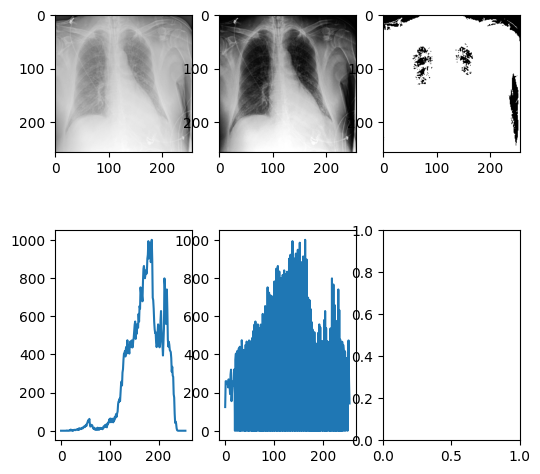

In [8]:
path = data_paths['path'].loc[idx[[lung_name], valid_name, covid_name, images_name]][0]
print(path)
full_file_path = os.path.join(db_path, path)
file_names = os.listdir(full_file_path)

# n = np.random.randint(0, len(file_names))
# print(n)
# file_name = file_names[n]
file_name = 'covid_1256.png'
file_name = 'sub-S09683_ses-E25533_run-1_bp-chest_vp-ap_cr.png'

full_file_name = os.path.join(full_file_path, file_name)
print(full_file_name)

image = cv2.imread(full_file_name, 0) 
image_rect = cv2.equalizeHist(image)

hist = cv2.calcHist([image],[0],None,[256],[0,256])
hist_rect = cv2.calcHist([image_rect],[0],None,[256],[0,256])

q1, q2 = scipy.stats.mstats.mquantiles(image_rect.flatten(), prob=[0.05, 0.95])

alpha = 0.5
threshold = (1. - alpha) * q1 + alpha * q2
ret, thresh = cv2.threshold(image, threshold, 255, 0)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(6, 6))
ax.flatten()[0].imshow(image, cmap='gray');
ax.flatten()[1].imshow(image_rect, cmap='gray');
ax.flatten()[2].imshow(thresh, cmap='gray');
ax.flatten()[3].plot(hist);
ax.flatten()[4].plot(hist_rect);


Compute statistical and geometrical metrics

In [ ]:
for path in data_paths.loc[idx[:,:,:,images_name]]['path']:
    full_file_path = os.path.join(db_path, path)
    full_output_path = os.path.join(output_path, path)
    #print(full_output_path)
    if not os.path.exists(full_output_path):
        os.makedirs(full_output_path, exist_ok=True)
    
    #print(full_file_path)
    file_names = os.listdir(full_file_path)
    
    stats_list = []
    for i, file_name in enumerate(file_names[:]):
        full_file_name = os.path.join(full_file_path, file_name)

        # print(full_file_name)
        image = cv2.imread(full_file_name, 0)    
        # hist = cv2.calcHist([image], [0], None, [256],[0,256])
        image = cv2.equalizeHist(image)
        
        flatten_image = np.asarray(image).flatten()
        _, (mini, maxi), mean, var, skew, kurt = scipy.stats.describe(flatten_image)
        std = np.sqrt(var)
        q05, q1, median, q3, q95 = scipy.stats.mstats.mquantiles(flatten_image, prob=[0.05, 0.25, 0.5, 0.75, 0.95])
        
        alpha = 0.5
        threshold = (1. - alpha) * q1 + alpha * q2
        ret, thresh = cv2.threshold(image, threshold, 1, 0)
        m = cv2.moments(thresh)
        
        x_center = m["m10"] / m["m00"] if m["m00"] != 0 else m["m10"]
        y_center = m["m01"] / m["m00"] if m["m00"] != 0 else m["m01"]
        #print(m)
        #cv2.circle(image, (int(x_center), int(y_center)), 5, (255), -1)
        #cv2.imshow("Image", image)
        #cv2.waitKey(0)
        #cv2.destroyAllWindows()
        
        stats_list.append([full_file_name,
                           mini, q1, median, q3, maxi, mean, std, skew, kurt,
                           m["m00"],
                           x_center, y_center,
                           m["nu20"], m["nu11"], m["nu02"],
                           m["nu30"], m["nu21"], m["nu12"], m["nu03"]])

    stats = pd.DataFrame(stats_list, columns=['file_name',
                                              'mini', 'q1', 'median', 'q3', 'maxi', 'mean', 'std', 'skew', 'kurt',
                                              'm00',
                                              'x_center', 'y_center',
                                              'nu20', 'nu11', 'nu02',
                                              'nu30', 'nu21', 'nu12', 'nu03'])
    
    full_stats_name = os.path.join(full_output_path, 'stats_equalize.joblib')
    joblib.dump(stats, full_stats_name)



Define working data base

In [9]:
# work_index = idx[[infection_name],:,:,[images_name]]
work_index = idx[[lung_name],:,:,[images_name]]


Read statistical and geometrical metrics

In [10]:
# stats_used = 'stats_crude.joblib'
stats_used = 'stats_equalize.joblib'

stats = None
true_labels = None
work_data_path = data_paths.loc[work_index]
print(len(work_data_path))
# work_data_path_index = work_data_path.index
# print(work_data_path_index[0])

for (ind, path) in work_data_path['path'].items():
    full_output_path = os.path.join(output_path, path)
    full_stats_name = os.path.join(full_output_path, stats_used)
    #print(os.path.exists(full_stats_name))
    
    # print(ind)
    stats_tmp = joblib.load(full_stats_name)
    # print(ind[2])
    true_labels_tmp = pd.DataFrame(data=[ind], columns=['db_name', 'ds_name', 'desease_name', 'data_type_name'])
    n = stats_tmp.shape[0]
    true_labels_tmp = true_labels_tmp.loc[true_labels_tmp.index.repeat(n)]
    
    if stats is None:
        stats = stats_tmp
        true_labels = true_labels_tmp
    else:
        stats = pd.concat([stats, stats_tmp], axis=0)
        true_labels = pd.concat([true_labels, true_labels_tmp], axis=0)
print(stats.shape)
#stats.index = work_index
file_names = stats['file_name'].reset_index(drop=True)
stats = stats.drop(columns=['file_name']).reset_index(drop=True)
true_labels = true_labels.reset_index(drop=True)
print(file_names.shape)
print(true_labels.shape)
#file_names

9
(33918, 20)
(33918,)
(33918, 4)


Duplicates detection

In [11]:
print(stats.duplicated().sum())
print(len(stats))

stats_file = pd.concat([stats, file_names], axis=1)
cols = stats_file.columns[:-1]
test = stats_file.sort_values(cols.to_list())
test_gp = test.groupby(by=cols.to_list())

pd.set_option('display.max_colwidth', None)
i = 0
for key, values in test_gp.groups.items():
  if len(values) == 1:
    continue
  print(test.loc[values]['file_name'], "\n")
  i += 1
  if i >= 10:
    break;
pd.reset_option('display.max_colwidth')
# test_gp.head()



0
33918


discard duplicates: <br>
keep ../data/Lung Segmentation Data/Test/COVID-19/images/covid_978.png <br>
to do: discard ../data/Lung Segmentation Data/Val/COVID-19/images/covid_2473.png <br>
<br>
keep ../data/Lung Segmentation Data/Train/COVID-19/images/covid_686.png <br>
to do: discard ../data/Lung Segmentation Data/Test/COVID-19/images/covid_3155.png <br>
<br>
keep ../data/Infection Segmentation Data/Train/COVID-19/images/covid_686.png <br>
to do: discard ../data/Infection Segmentation Data/Test/COVID-19/images/covid_3155.png <br>

Features correlation

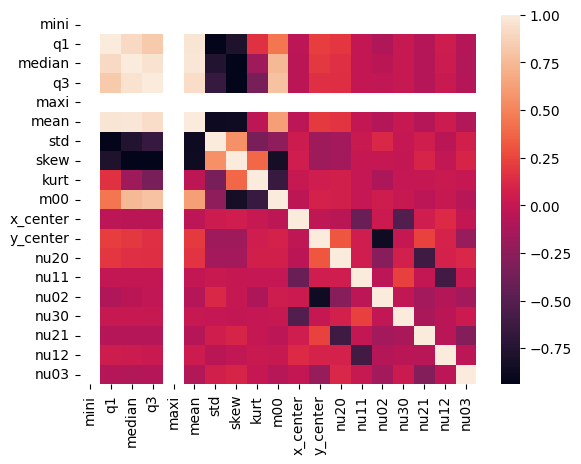

In [12]:
sns_plot = sns.heatmap(data=stats.corr());

fig = sns_plot.get_figure()
plt.savefig(os.path.join(output_path, 'all features correlation.png'), format='png')

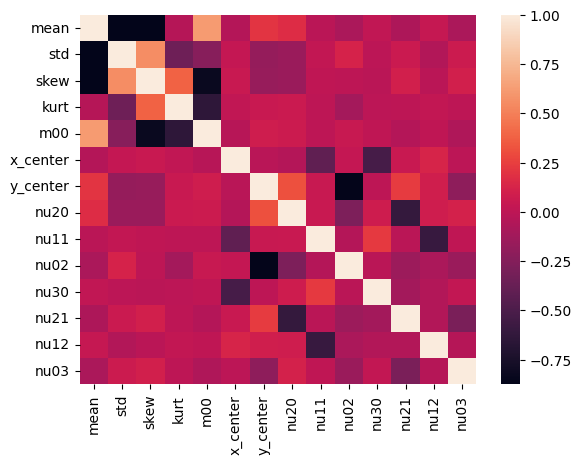

In [13]:
stats = stats.drop(columns=['mini', 'maxi', 'median', 'q1', 'q3'])
sns_plot = sns.heatmap(data=stats.corr());

fig = sns_plot.get_figure()
plt.savefig(os.path.join(output_path, 'selected features correlation.png'), format='png')

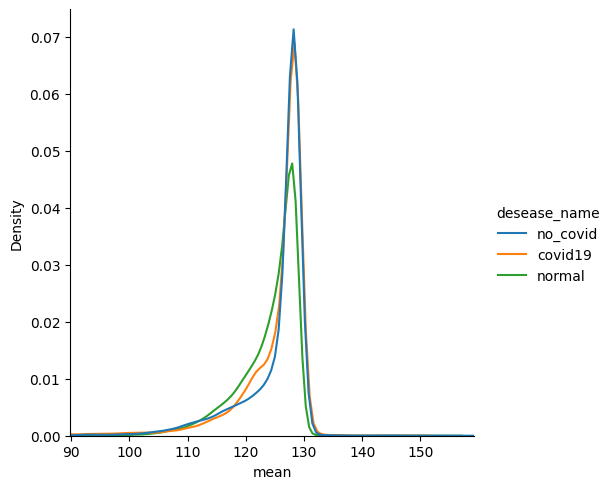

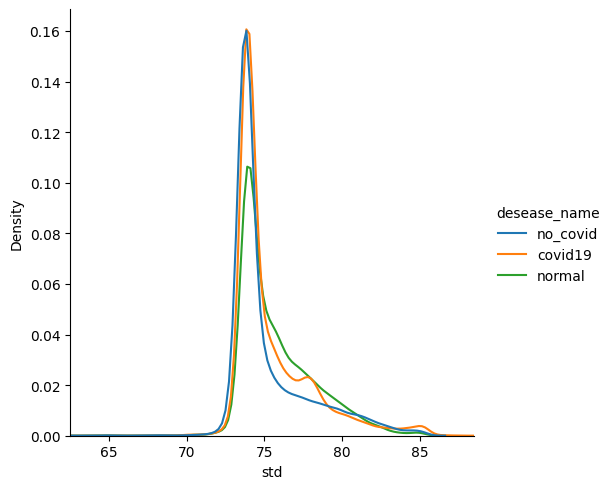

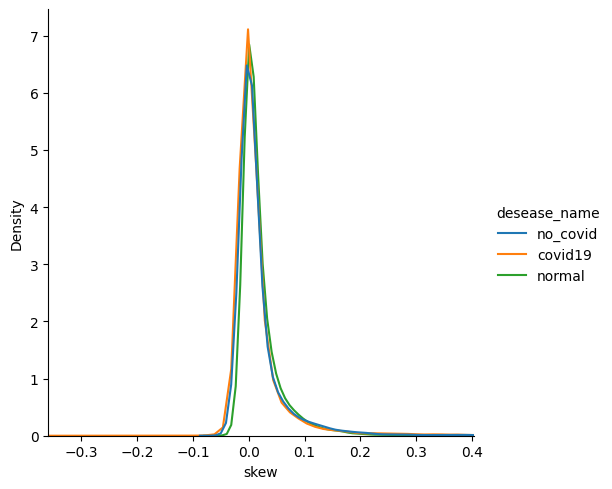

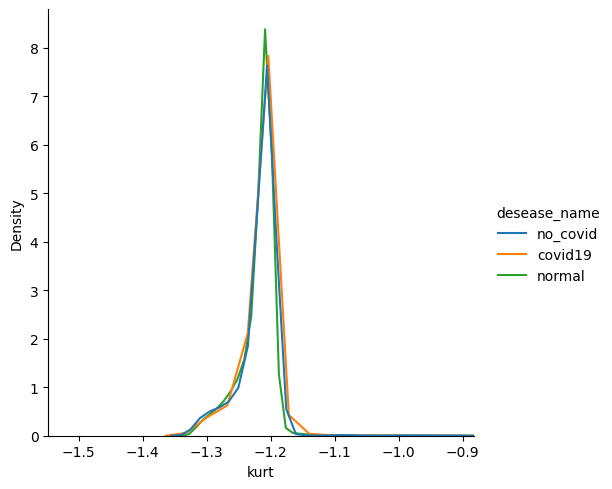

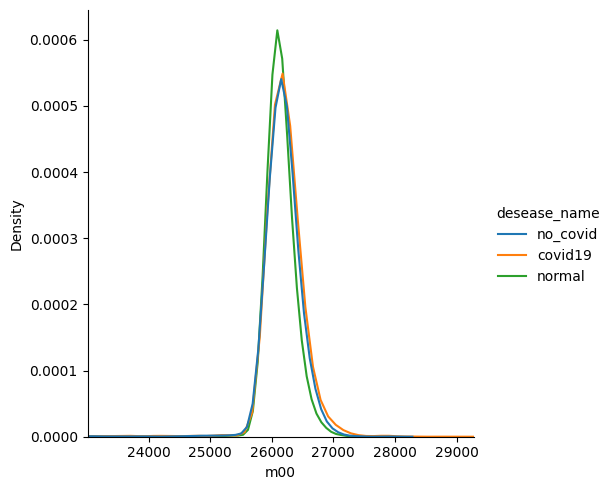

...

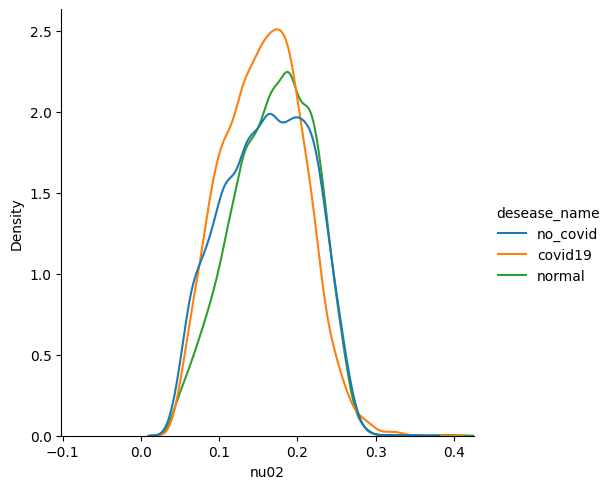

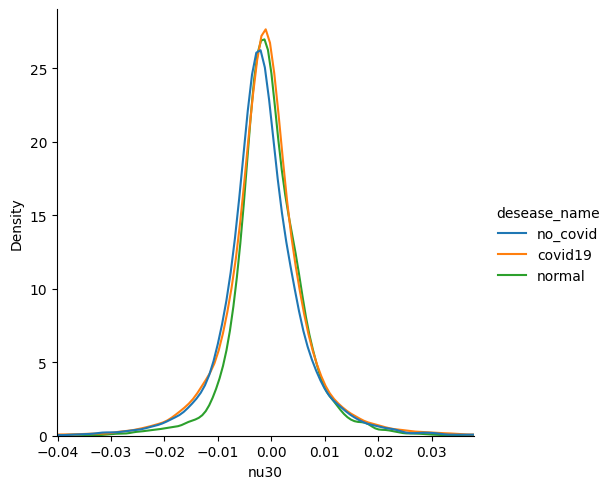

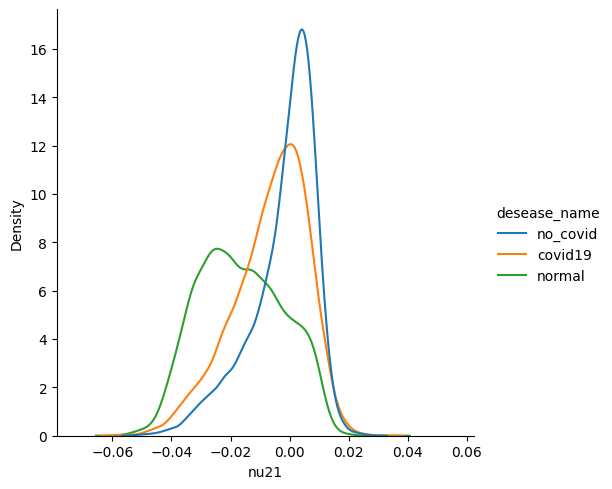

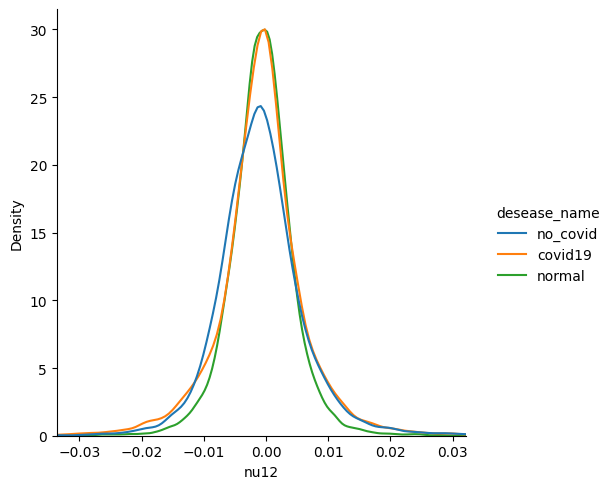

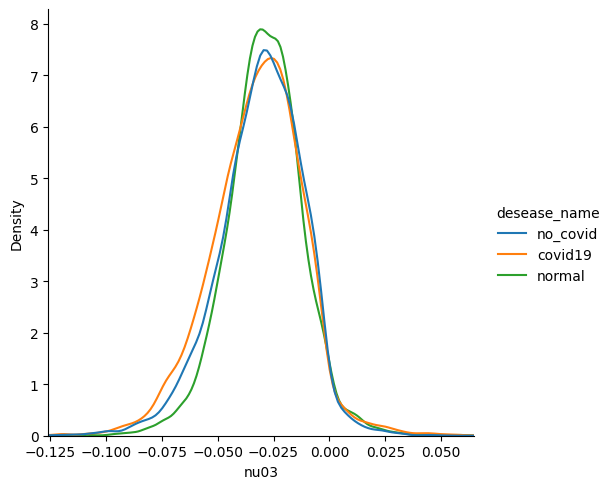

In [14]:
stats_visu = pd.concat([stats, true_labels['desease_name']], axis=1)
# stats_visu.info()

output_visu_path = os.path.join(output_path, 'features')
if not os.path.exists(output_visu_path):
    os.makedirs(output_visu_path, exist_ok=True)

range_rate = 5
cols = stats_visu.select_dtypes(include=['number']).columns
for i, col in enumerate(cols):
  m = stats[col].mean()
  std = stats[col].std()
  sns_plot = sns.displot(data=stats_visu, x=col, hue='desease_name', kind='kde');
  plt.xlim([m-range_rate*std, m+range_rate*std])
  plt.savefig(os.path.join(output_visu_path, col + '.png'), format='png')
  plt.show()

Features scaling

In [15]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_stats = scaler.fit_transform(stats)
scaled_stats = pd.DataFrame(scaled_stats, columns=stats.columns)
print(file_names.shape)

(33918,)


PCA analysis

In [16]:
from sklearn.decomposition import PCA

pca = PCA(tol=1e-6)
principalComponents = pca.fit_transform(scaled_stats)
principalComponents.shape

(33918, 14)

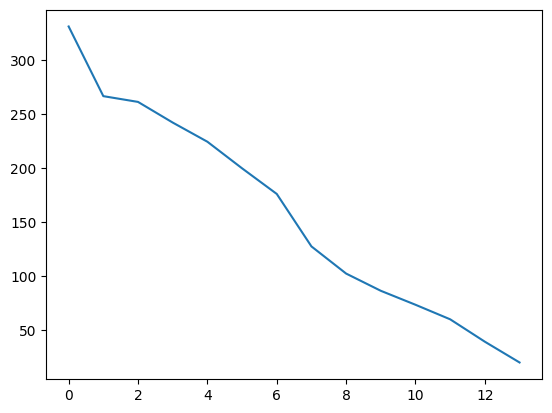

In [17]:

eigan_val = pca.singular_values_
x = range(0, eigan_val.shape[0])
plt.plot(x, eigan_val);
plt.savefig(os.path.join(output_path, 'pca singular values.png'), format='png')

Features selection

In [18]:
num_dim = 11
selected_features = principalComponents[:, :num_dim]
# selected_features = principalComponents
# selected_features = scaled_stats
selected_features.shape

(33918, 11)

Outliers detection

In [19]:
# from sklearn import svm

# clf_osvm = svm.OneClassSVM(kernel='rbf', nu=0.00001, gamma='scale')
# # Model training
# clf_osvm.fit(selected_features)
# # Prediction from the explanatory variables of the test sample
# y_pred_osvm = clf_osvm.predict(selected_features)
# print(y_pred_osvm.shape)


In [20]:
from sklearn.ensemble import IsolationForest

isof = IsolationForest(contamination=0.0025, n_estimators=250, n_jobs=-1)

isof.fit(selected_features)
y_pred_isof = isof.predict(selected_features)
print(y_pred_isof.shape)


(33918,)


In [21]:
# y_pred_select = y_pred_osvm
y_pred_select = y_pred_isof
print(y_pred_select.shape)


(33918,)


Outliers visualization

85


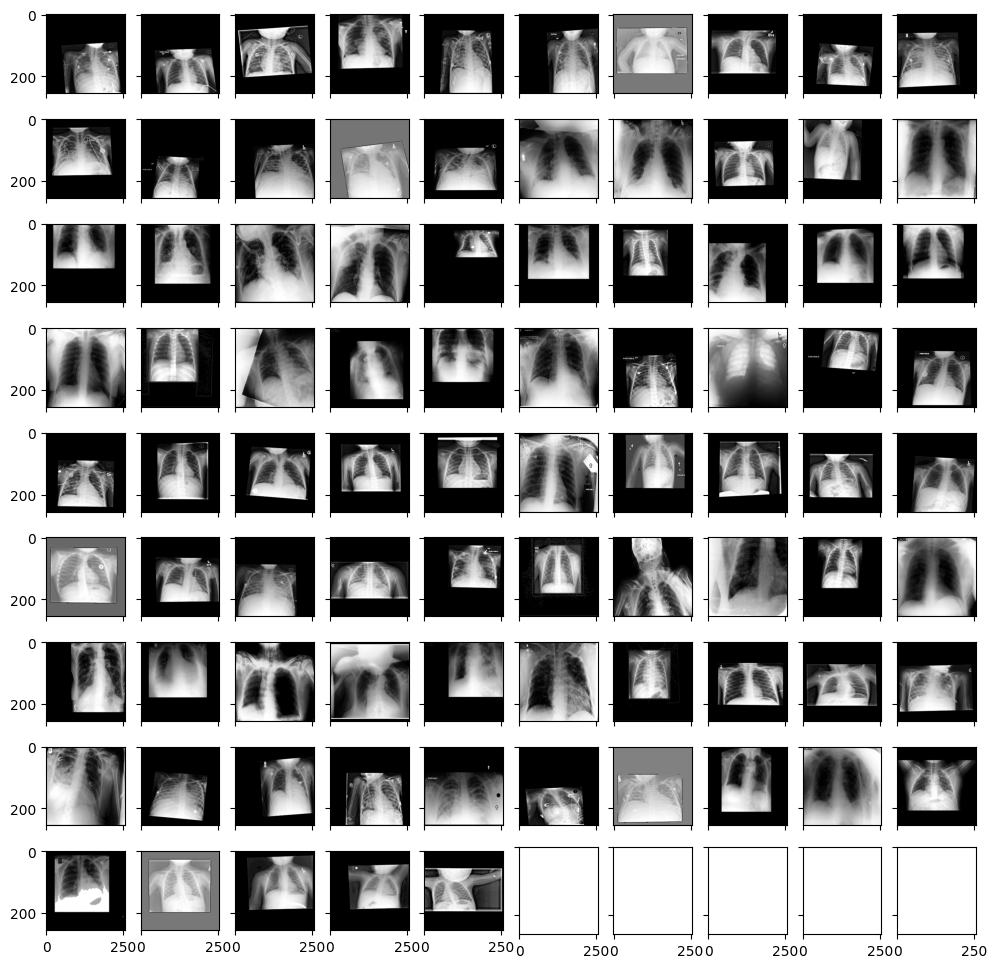

['../output/outliers.joblib']

In [22]:
ind = y_pred_select == -1
n_outliers = y_pred_select[ind].shape[0]
print(n_outliers)

# outliers = true_labels[ind]
# # outliers
# outliers['place'] = outliers.apply(lambda x: x['db_name'] + ' ' + x['ds_name'] + ' ' + x['desease_name'], axis=1)
# print(outliers['place'].unique())

outliers = file_names[ind]
n = len(outliers)
nrows = 9
ncols = 10
num_img = nrows * ncols
samples = outliers
if num_img < len(samples):
    samples = samples.sample(n=num_img, replace=False)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True, figsize=(12, 12))
for i, file_name in enumerate(samples):
    image = cv2.imread(file_name, 0)
    image = cv2.equalizeHist(image)    
    ax.flatten()[i].imshow(image, cmap='gray')

plt.savefig(os.path.join(output_path, 'outliers.png'), format='png')
plt.show()
joblib.dump(outliers, os.path.join(output_path, 'outliers.joblib'))

Discard outliers

In [23]:
# print(len(y_pred_select))
# print(len(file_names))
# print(len(true_labels))
# print(len(selected_features))

selected_features_cleaned = selected_features[y_pred_select == 1, :]

drop = y_pred_select == -1
file_names_cleaned = file_names.drop(file_names.iloc[drop].index).reset_index(drop=True)
true_labels_cleaned = true_labels.drop(true_labels.iloc[drop].index).reset_index(drop=True)

# print(len(file_names_cleaned))
# print(len(true_labels_cleaned))
# print(len(selected_features_cleaned))



K-means clustering

In [24]:
from sklearn.cluster import KMeans

kmeans_kwargs = {n_init=10}
sse = []
s_scores = []
k_number = 40
for k in range(1, k_number):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(selected_features_cleaned)
   sse.append(kmeans.inertia_)

# for k in range(2, k_number):
   # # Calculation of the silhouette coefficient
   # s_score = silhouette_score(selected_features_cleaned, kmeans.labels_, metric='sqeuclidean')
   # s_scores.append(s_score)


/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `

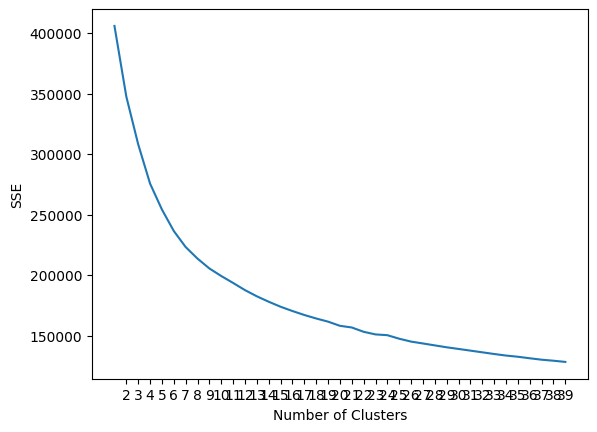

In [25]:
fig, ax1 = plt.subplots()
ax1.set_xticks(range(2, k_number))
ax1.set_xlabel("Number of Clusters")
ax1.set_ylabel("SSE")
ax1.plot(range(1, k_number), sse)

# ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
# ax2.set_ylabel("Silhouette")
# ax2.plot(range(2, k_number), s_scores)
# ax2.plot(range(1, k_number), sse)

plt.savefig(os.path.join(output_path, 'sse and silhouette vs n clusters.png'), format='png')
plt.show()


In [26]:
n_clusters = 10
kmeans_kwargs = {}
kmeans = KMeans(n_clusters=n_clusters, **kmeans_kwargs)
kmeans.fit(selected_features_cleaned)

print(kmeans.labels_.shape)

/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(33833,)


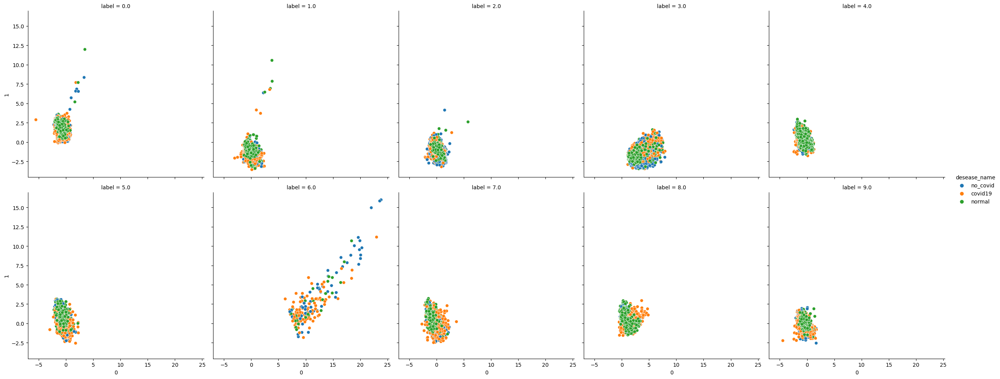

In [27]:
visu = pd.concat([pd.DataFrame(selected_features_cleaned), pd.DataFrame(kmeans.labels_, columns=['label']), true_labels], axis=1)
sns_plot = sns.relplot(data=visu, x=0, y=1, hue='desease_name', col='label', col_wrap=5);

fig = sns_plot.fig
plt.savefig(os.path.join(output_path, 'clusters.png'), format='png')

In [28]:
labels = pd.Series(kmeans.labels_, name='label').astype(int)
# print(labels.shape)

file_names_cleaned_extended = pd.concat([file_names_cleaned, labels, true_labels_cleaned], axis=1)
# print(file_names_cleaned_extended.isna().sum())
# print(file_names_cleaned_extended.head())


Cluster plots

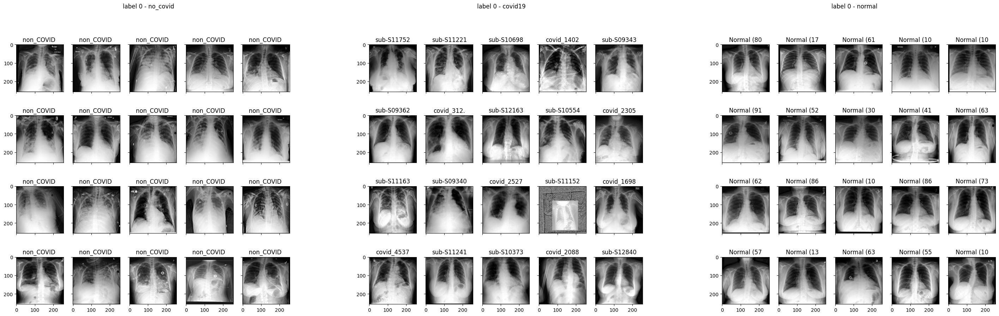

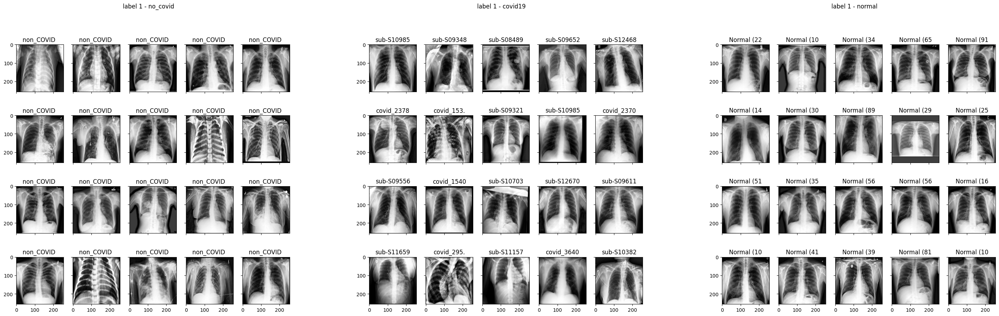

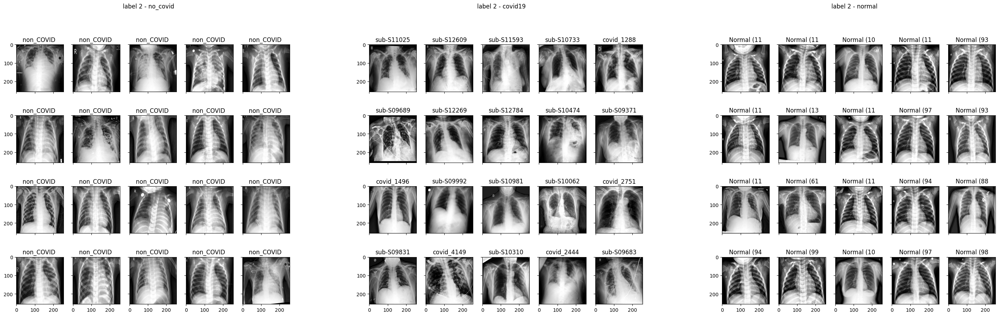

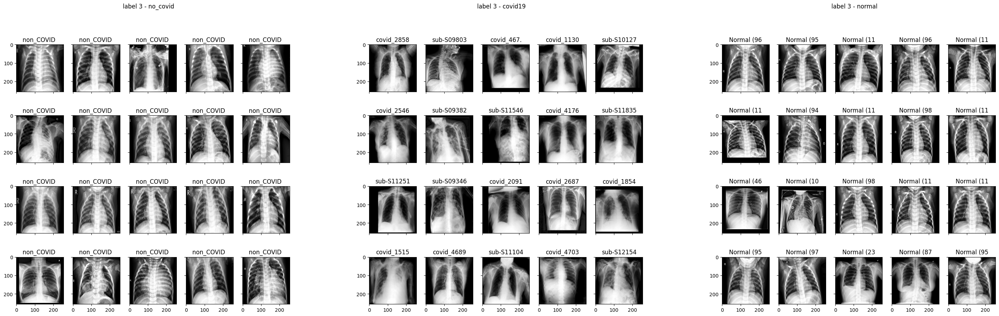

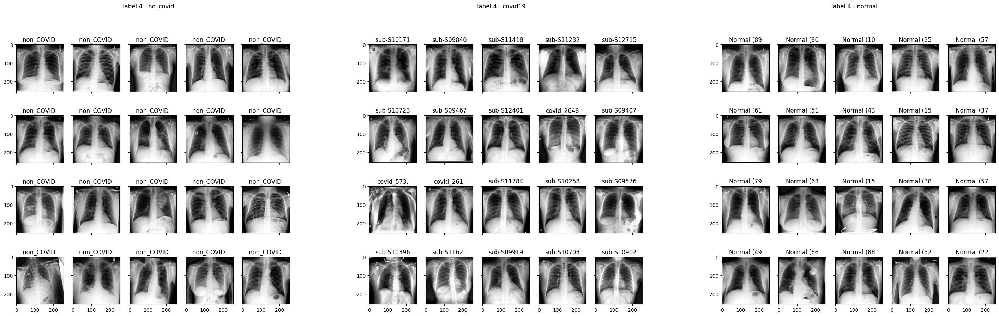

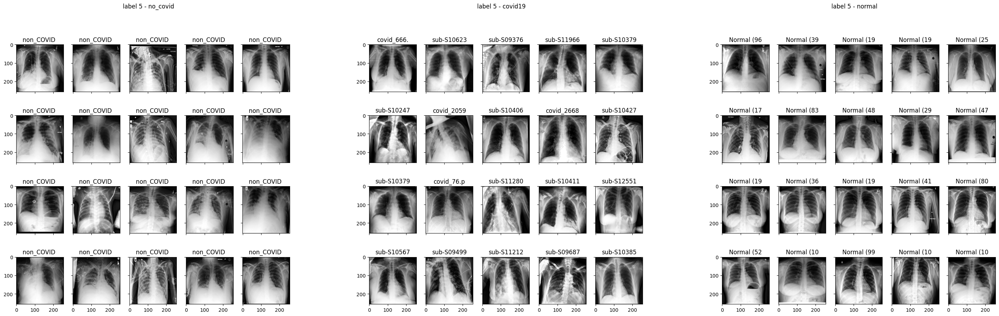

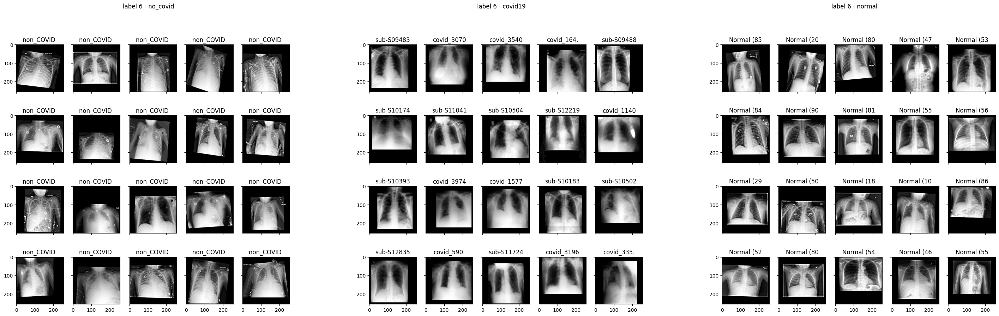

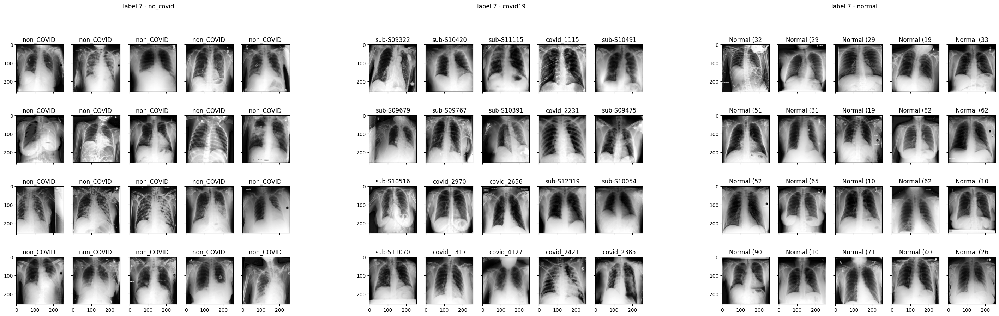

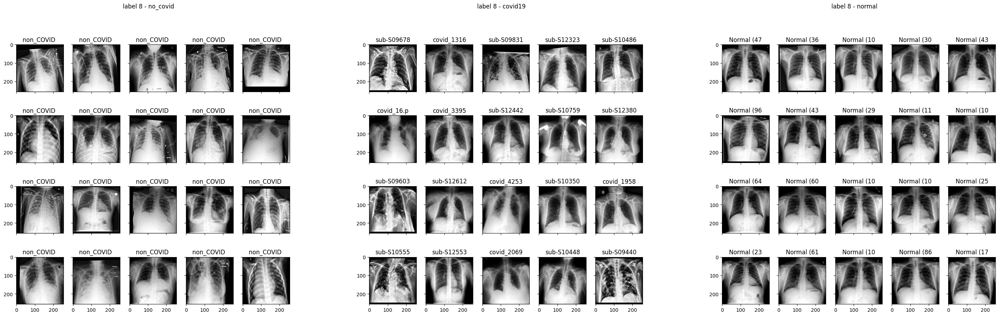

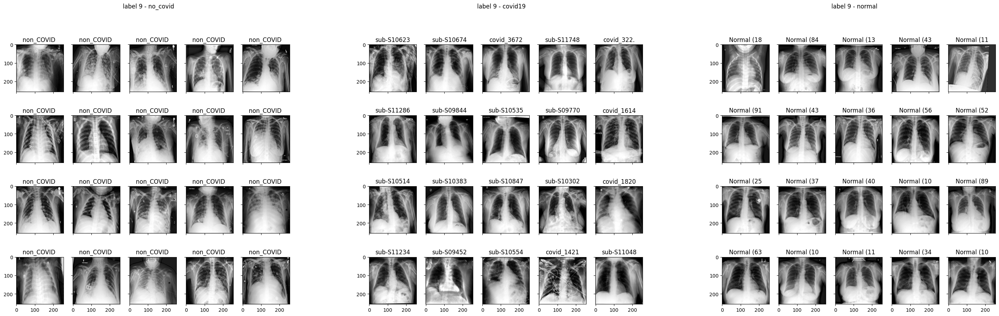

In [29]:
# sub_file_names = file_names_extended[file_names['db_name'] == infection_name]
sub_file_names = file_names_cleaned_extended
# print(sub_file_names.head())

labels_number = np.sort(sub_file_names['label'].unique())
# print(labels_number)

output_visu_path = os.path.join(output_path, 'clusters')
if not os.path.exists(output_visu_path):
    os.makedirs(output_visu_path, exist_ok=True)

nrows = 4
ncols = 5
num_img = nrows * ncols
for num_label in labels_number:
    label_file_names = sub_file_names[sub_file_names['label'] == num_label]
    # print(label_file_names.head())
    # n = len(label_file_names)
    
    deseases = label_file_names['desease_name'].unique()
    n_deseases = len(deseases)

    fig = plt.figure(figsize=(3*10, 10))
    sfigures = fig.subfigures(1, n_deseases)
    for i, des in enumerate(deseases):
        sfig = sfigures[i]
        ax = sfig.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
        sfig.suptitle('label ' + str(num_label) + " - " + des)
    
    for i, des in enumerate(deseases):
        sub_label_file_names = label_file_names[label_file_names['desease_name'] == des]
        # print(sub_label_file_names.head())
        n = len(sub_label_file_names)

        sfig = sfigures[i]
        axes = sfig.get_axes()
        
        samples = sub_label_file_names
        if (len(samples) >= num_img):
          samples = samples.sample(n=num_img, replace=False)
        # print(sub_label_file_names.head())
        # print('sample: ', sample)
        for k, (_, row) in enumerate(samples.iterrows()):
            # print('row: ', row)
            file_name = row['file_name']
            db_name = row['db_name']

            image = cv2.imread(file_name, 0)   
            image = cv2.equalizeHist(image)

            axe = axes[k]
            axe.imshow(image, cmap='gray')
            
            # print(db_name + ' - ' + infection_name)
            if  db_name == infection_name:
                # print(db_name + ' - ' + infection_name)
                mask_infection = cv2.imread(file_name.replace(images_dirname, infection_masks_dirname), 0) 
                axe.imshow(mask_infection, alpha=0.4)

            f_name = os.path.basename(file_name)[:10]
            # print(f_name)
            axe.set_title(f_name)

    # label_file_names = label_file_names.sample(n=num_img, replace=False)
    # for i, file_name in enumerate(label_file_names['file_name']):
    #     image = cv2.imread(file_name, 0)    
    #     ax_0.flatten()[i].imshow(image, cmap='gray')

    plt.savefig(os.path.join(output_visu_path ,'label_' + str(num_label) + '.png'), format='png')
    plt.show()
    plt.close(fig)
    
# plt.show()

Test with CLAHE(Contrast Limited Adaptive Histogram Equalization)<br>
ref: https://docs.opencv.org/3.1.0/d5/daf/tutorial_py_histogram_equalization.html<br>

Finaly global hist equalizer used

NameError: name 'images_dirname' is not defined

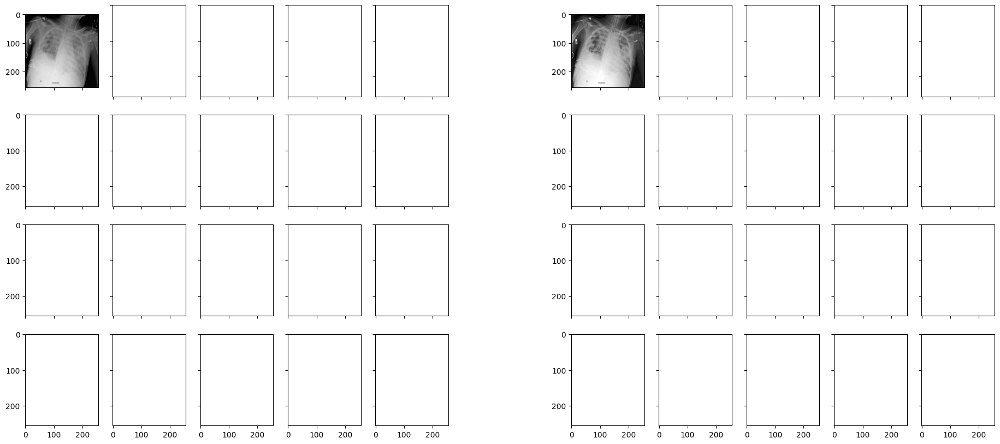

In [30]:
sub_file_names = file_names_cleaned_extended

n = len(sub_file_names)

fig = plt.figure(figsize=(2*10, 10))
fig_0, fig_1 = fig.subfigures(1, 2)

nrows = 4
ncols = 5
num_img = nrows * ncols
fig_0.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_0 = fig_0.get_axes()
fig_1.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_1 = fig_1.get_axes()

# contrast_limit = 1.0
# clahe = cv2.createCLAHE(clipLimit=contrast_limit, tileGridSize=(16, 16))

samples = sub_file_names
if (len(samples) >= num_img):
  samples = samples.sample(n=num_img, replace=False)
# print(samples.head())
for i, (_, row) in enumerate(samples.iterrows()):
    file_name = row['file_name']
    db_name = row['db_name']

    image = cv2.imread(file_name, 0)    
    axes_0[i].imshow(image, cmap='gray')
    
    # image = clahe.apply(image)
    image = cv2.equalizeHist(image)
    axes_1[i].imshow(image, cmap='gray')

    mask_lung = cv2.imread(file_name.replace(images_dirname, lung_masks_dirname), 0) 
    axe.imshow(mask_lung, alpha=0.4)

    if  db_name == infection_name:
        # print(db_name + ' - ' + infection_name)
        mask_infection = cv2.imread(file_name.replace(images_dirname, infection_masks_dirname), 0) 
        axe.imshow(mask_infection, alpha=0.4)

    
plt.show()